In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.tree import  DecisionTreeClassifier
from sklearn.tree import plot_tree
from sklearn import tree
from sklearn.metrics import classification_report
from sklearn import preprocessing

## 1. Import the dataset

In [3]:
heart_disease = pd.read_csv("C:\\Users\\hp\\Desktop\\heart_disease.csv")
heart_disease

,age,sex,cp,trestbps,chol,fbs,restecg,thalch,exang,oldpeak,slope,thal,num
0,63,Male,typical angina,145,233,True,lv hypertrophy,150,FALSE,2.3,downsloping,fixed defect,0
1,41,Male,atypical angina,135,203,False,normal,132,FALSE,0.0,flat,fixed defect,0
2,57,Male,asymptomatic,140,192,False,normal,148,FALSE,0.4,flat,fixed defect,0
3,52,Male,typical angina,118,186,False,lv hypertrophy,190,FALSE,0.0,flat,fixed defect,0
4,57,Male,asymptomatic,110,201,False,normal,126,TRUE,1.5,flat,fixed defect,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
903,53,Male,asymptomatic,125,0,False,normal,120,FALSE,1.5,upsloping,normal,4
904,62,Male,asymptomatic,166,170,False,st-t abnormality,120,TRUE,3.0,flat,normal,4
905,56,Male,non-anginal,170,0,False,lv hypertrophy,123,TRUE,2.5,downsloping,reversable defect,4
906,56,Male,non-anginal,144,208,True,st-t abnormality,105,TURE,NaN,downsloping,normal,4


In [5]:
heart_disease.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 908 entries, 0 to 907
Data columns (total 13 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   age       908 non-null    int64  
 1   sex       908 non-null    object 
 2   cp        908 non-null    object 
 3   trestbps  908 non-null    int64  
 4   chol      908 non-null    int64  
 5   fbs       908 non-null    bool   
 6   restecg   908 non-null    object 
 7   thalch    908 non-null    int64  
 8   exang     908 non-null    object 
 9   oldpeak   846 non-null    float64
 10  slope     908 non-null    object 
 11  thal      908 non-null    object 
 12  num       908 non-null    int64  
dtypes: bool(1), float64(1), int64(5), object(6)
memory usage: 86.1+ KB


## 2. Exploratory data analysis

In [7]:
heart_disease['exang'] = heart_disease['exang'].replace({'TRUE': True, 'FALSE': False, 'TURE': True})

C:\Users\hp\AppData\Local\Temp\ipykernel_12760\8678383.py:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  heart_disease['exang'] = heart_disease['exang'].replace({'TRUE': True, 'FALSE': False, 'TURE': True})


#### Encode the data into labels

In [9]:
label_encoder = preprocessing.LabelEncoder()

heart_disease['sex']= label_encoder.fit_transform(heart_disease['sex']) 
heart_disease['cp']= label_encoder.fit_transform(heart_disease['cp'])
heart_disease['fbs']= label_encoder.fit_transform(heart_disease['fbs'])
heart_disease['restecg']= label_encoder.fit_transform(heart_disease['restecg'])
heart_disease['exang']= label_encoder.fit_transform(heart_disease['exang'])
heart_disease['slope']= label_encoder.fit_transform(heart_disease['slope'])
heart_disease['thal']= label_encoder.fit_transform(heart_disease['thal'])

In [11]:
heart_disease

,age,sex,cp,trestbps,chol,fbs,restecg,thalch,exang,oldpeak,slope,thal,num
0,63,1,3,145,233,1,0,150,0,2.3,0,0,0
1,41,1,1,135,203,0,1,132,0,0.0,1,0,0
2,57,1,0,140,192,0,1,148,0,0.4,1,0,0
3,52,1,3,118,186,0,0,190,0,0.0,1,0,0
4,57,1,0,110,201,0,1,126,1,1.5,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
903,53,1,0,125,0,0,1,120,0,1.5,2,1,4
904,62,1,0,166,170,0,2,120,1,3.0,1,1,4
905,56,1,2,170,0,0,0,123,1,2.5,0,2,4
906,56,1,2,144,208,1,2,105,1,NaN,0,1,4


In [13]:
heart_disease.describe()

,age,sex,cp,trestbps,chol,fbs,restecg,thalch,exang,oldpeak,slope,thal,num
count,908.000000,908.000000,908.000000,908.000000,908.000000,908.000000,908.000000,908.000000,908.000000,846.000000,908.000000,908.000000,908.000000
mean,53.791850,0.790749,0.777533,133.430617,201.484581,0.203744,0.991189,135.957048,0.410793,0.891253,1.155286,1.170705,1.008811
std,9.158031,0.406998,0.958374,20.401608,112.097949,0.403003,0.635177,26.804929,0.492249,1.093875,0.691023,0.753193,1.144436
min,29.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,60.000000,0.000000,-2.600000,0.000000,0.000000,0.000000
25%,47.750000,1.000000,0.000000,120.000000,176.750000,0.000000,1.000000,118.000000,0.000000,0.000000,1.000000,1.000000,0.000000
50%,54.000000,1.000000,0.000000,130.000000,224.000000,0.000000,1.000000,138.000000,0.000000,0.500000,1.000000,1.000000,1.000000
75%,60.000000,1.000000,2.000000,144.000000,270.000000,0.000000,1.000000,156.000000,1.000000,1.500000,2.000000,2.000000,2.000000
max,77.000000,1.000000,3.000000,200.000000,603.000000,1.000000,2.000000,202.000000,1.000000,6.200000,2.000000,2.000000,4.000000


#### Handle missing values

In [15]:
heart_disease[heart_disease.isnull().any(axis=1)].shape

(62, 13)

In [17]:
heart_disease['oldpeak']= heart_disease['oldpeak'].fillna(heart_disease.oldpeak.median())

In [19]:
heart_disease.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 908 entries, 0 to 907
Data columns (total 13 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   age       908 non-null    int64  
 1   sex       908 non-null    int32  
 2   cp        908 non-null    int32  
 3   trestbps  908 non-null    int64  
 4   chol      908 non-null    int64  
 5   fbs       908 non-null    int64  
 6   restecg   908 non-null    int32  
 7   thalch    908 non-null    int64  
 8   exang     908 non-null    int64  
 9   oldpeak   908 non-null    float64
 10  slope     908 non-null    int32  
 11  thal      908 non-null    int32  
 12  num       908 non-null    int64  
dtypes: float64(1), int32(5), int64(7)
memory usage: 74.6 KB


#### Checking the outliers

<Axes: >

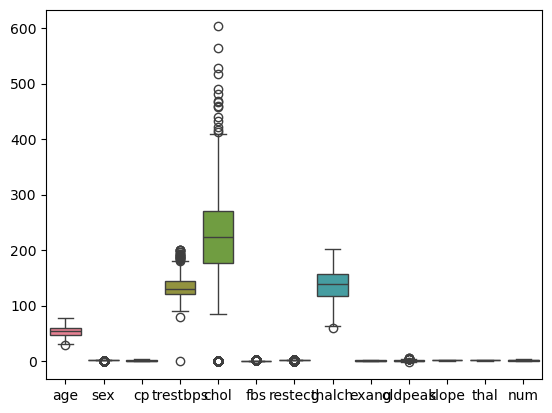

In [21]:
sns.boxplot(heart_disease)

#### Treating the ouliers

##### Delete the ouliers

In [23]:
# Calculate Q1, Q3, and IQR
Q1 = heart_disease['age'].quantile(0.25)
Q3 = heart_disease['age'].quantile(0.75)
IQR = Q3 - Q1

# Determine bounds
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Filter out outliers
heart_disease = heart_disease[(heart_disease['age'] >= lower_bound) & (heart_disease['age'] <= upper_bound)]

In [25]:
# Calculate Q1, Q3, and IQR
Q1 = heart_disease['thalch'].quantile(0.25)
Q3 = heart_disease['thalch'].quantile(0.75)
IQR = Q3 - Q1

# Determine bounds
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Filter out outliers
heart_disease = heart_disease[(heart_disease['thalch'] >= lower_bound) & (heart_disease['thalch'] <= upper_bound)]

##### Replace the outliers

In [27]:
# Calculate Q1, Q3, and IQR
Q1 = heart_disease['trestbps'].quantile(0.25)
Q3 = heart_disease['trestbps'].quantile(0.75)
IQR = Q3 - Q1

# Determine bounds
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Replace outliers
heart_disease['trestbps'] = heart_disease['trestbps'].clip(lower=lower_bound, upper=upper_bound)

In [29]:
# Calculate Q1, Q3, and IQR
Q1 = heart_disease['chol'].quantile(0.25)
Q3 = heart_disease['chol'].quantile(0.75)
IQR = Q3 - Q1

# Determine bounds
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Replace outliers
heart_disease['chol'] = heart_disease['chol'].clip(lower=lower_bound, upper=upper_bound)

In [31]:
# Calculate Q1, Q3, and IQR
Q1 = heart_disease['oldpeak'].quantile(0.25)
Q3 = heart_disease['oldpeak'].quantile(0.75)
IQR = Q3 - Q1

# Determine bounds
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Replace outliers
heart_disease['oldpeak'] = heart_disease['oldpeak'].clip(lower=lower_bound, upper=upper_bound)

In [33]:
heart_disease.reset_index(drop=True, inplace=True)
heart_disease

,age,sex,cp,trestbps,chol,fbs,restecg,thalch,exang,oldpeak,slope,thal,num
0,63,1,3,145,233.0,1,0,150,0,2.3,0,0,0
1,41,1,1,135,203.0,0,1,132,0,0.0,1,0,0
2,57,1,0,140,192.0,0,1,148,0,0.4,1,0,0
3,52,1,3,118,186.0,0,0,190,0,0.0,1,0,0
4,57,1,0,110,201.0,0,1,126,1,1.5,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
901,53,1,0,125,37.5,0,1,120,0,1.5,2,1,4
902,62,1,0,166,170.0,0,2,120,1,3.0,1,1,4
903,56,1,2,170,37.5,0,0,123,1,2.5,0,2,4
904,56,1,2,144,208.0,1,2,105,1,0.5,0,1,4


#### Visualize the distribution of features

<Axes: >

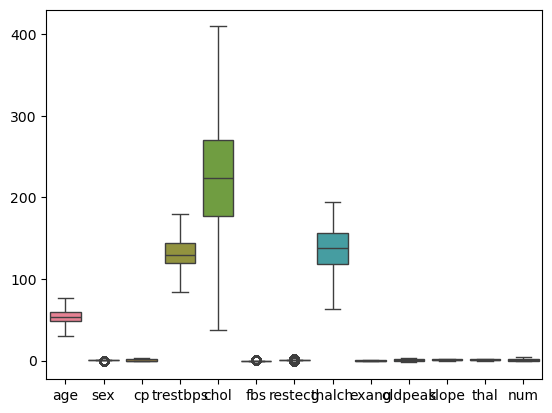

In [35]:
sns.boxplot(heart_disease)

In [37]:
heart_disease.describe()

,age,sex,cp,trestbps,chol,fbs,restecg,thalch,exang,oldpeak,slope,thal,num
count,906.000000,906.000000,906.000000,906.000000,906.000000,906.000000,906.000000,906.000000,906.000000,906.000000,906.000000,906.000000,906.000000
mean,53.822296,0.790287,0.778146,133.279249,207.661148,0.204194,0.992274,135.967991,0.411700,0.856733,1.154525,1.171082,1.008830
std,9.130508,0.407329,0.959055,19.320168,96.593884,0.403334,0.635024,26.625126,0.492413,1.025080,0.691197,0.753982,1.144735
min,30.000000,0.000000,0.000000,84.000000,37.500000,0.000000,0.000000,63.000000,0.000000,-2.250000,0.000000,0.000000,0.000000
25%,48.000000,1.000000,0.000000,120.000000,177.000000,0.000000,1.000000,118.000000,0.000000,0.000000,1.000000,1.000000,0.000000
50%,54.000000,1.000000,0.000000,130.000000,224.000000,0.000000,1.000000,138.000000,0.000000,0.500000,1.000000,1.000000,1.000000
75%,60.000000,1.000000,2.000000,144.000000,270.000000,0.000000,1.000000,156.000000,1.000000,1.500000,2.000000,2.000000,2.000000
max,77.000000,1.000000,3.000000,180.000000,409.500000,1.000000,2.000000,195.000000,1.000000,3.750000,2.000000,2.000000,4.000000


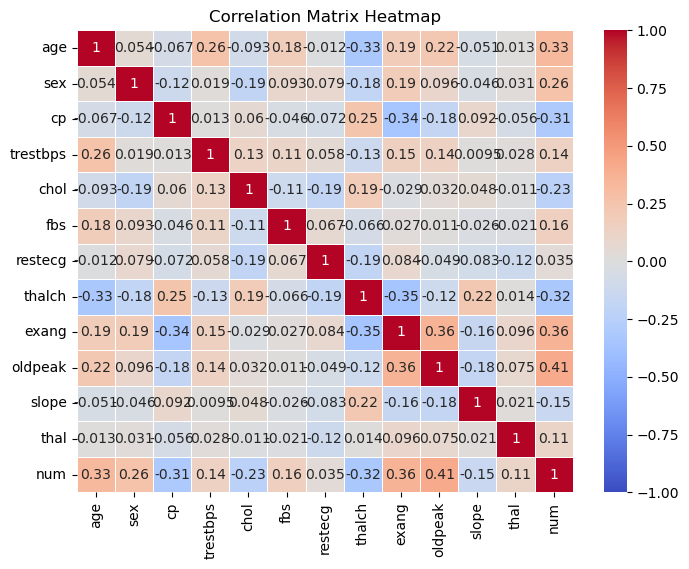

In [39]:
corr = heart_disease.corr()

# Plot heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(corr, annot=True, cmap='coolwarm', linewidths=0.5, vmin=-1, vmax=1)
plt.title('Correlation Matrix Heatmap')
plt.show()

## 3. Feature engineering

In [41]:
x=heart_disease.iloc[:,0:11]
y=heart_disease['num']

In [43]:
x

,age,sex,cp,trestbps,chol,fbs,restecg,thalch,exang,oldpeak,slope
0,63,1,3,145,233.0,1,0,150,0,2.3,0
1,41,1,1,135,203.0,0,1,132,0,0.0,1
2,57,1,0,140,192.0,0,1,148,0,0.4,1
3,52,1,3,118,186.0,0,0,190,0,0.0,1
4,57,1,0,110,201.0,0,1,126,1,1.5,1
...,...,...,...,...,...,...,...,...,...,...,...
901,53,1,0,125,37.5,0,1,120,0,1.5,2
902,62,1,0,166,170.0,0,2,120,1,3.0,1
903,56,1,2,170,37.5,0,0,123,1,2.5,0
904,56,1,2,144,208.0,1,2,105,1,0.5,0


In [45]:
y

0      0
1      0
2      0
3      0
4      0
      ..
901    4
902    4
903    4
904    4
905    4
Name: num, Length: 906, dtype: int64

In [47]:
heart_disease.num.value_counts()

num
0    398
1    265
2    108
3    107
4     28
Name: count, dtype: int64

In [49]:
from imblearn.over_sampling import SMOTE
smote = SMOTE(random_state=42)
# Fit and transform the training data
x_resampled, y_resampled = smote.fit_resample(x, y)

In [51]:
y_resampled.value_counts()

num
0    398
1    398
2    398
3    398
4    398
Name: count, dtype: int64

In [53]:
from sklearn.tree import  DecisionTreeClassifier
model = DecisionTreeClassifier(criterion= "entropy")
model.fit(x_resampled, y_resampled)
print(model.feature_importances_)

[0.12125913 0.02154239 0.05125913 0.15050849 0.14684736 0.01679583
 0.05275429 0.16700308 0.03395808 0.18177206 0.05630015]


In [55]:
x_resampled.drop(x_resampled.columns[[1, 2, 5, 6, 8, 10]], axis=1, inplace=True)

In [57]:
x_resampled

,age,trestbps,chol,thalch,oldpeak
0,63,145,233.000000,150,2.300000
1,41,135,203.000000,132,0.000000
2,57,140,192.000000,148,0.400000
3,52,118,186.000000,190,0.000000
4,57,110,201.000000,126,1.500000
...,...,...,...,...,...
1985,64,141,224.559258,134,2.610519
1986,54,119,37.500000,95,0.419800
1987,62,155,252.983716,113,3.127035
1988,62,159,252.985780,108,2.930054


## 4. Decision Tree Classification

In [59]:
# Splitting data into training and testing data set
x_train, x_test,y_train,y_test = train_test_split(x_resampled,y_resampled, test_size=0.3,random_state=10)

In [61]:
y_train.value_counts()

num
3    286
2    284
1    284
0    277
4    262
Name: count, dtype: int64

In [63]:
y_test.value_counts()

num
4    136
0    121
2    114
1    114
3    112
Name: count, dtype: int64

In [65]:
model= DecisionTreeClassifier()
model.fit(x_train,y_train)

DecisionTreeClassifier()

In [67]:
pred_train=model.predict(x_train)
pd.Series(pred_train).value_counts()

3    286
2    284
1    284
0    277
4    262
Name: count, dtype: int64

In [69]:
#Predicting on test data
preds = model.predict(x_test) # predicting on test data set 
pd.Series(preds).value_counts() # getting the count of each category 

4    129
3    123
1    121
2    119
0    105
Name: count, dtype: int64

In [71]:
print(classification_report(pred_train,y_train))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       277
           1       1.00      1.00      1.00       284
           2       1.00      1.00      1.00       284
           3       1.00      1.00      1.00       286
           4       1.00      1.00      1.00       262

    accuracy                           1.00      1393
   macro avg       1.00      1.00      1.00      1393
weighted avg       1.00      1.00      1.00      1393



In [73]:
print(classification_report(preds,y_test))

              precision    recall  f1-score   support

           0       0.52      0.60      0.56       105
           1       0.44      0.41      0.43       121
           2       0.57      0.55      0.56       119
           3       0.67      0.61      0.64       123
           4       0.78      0.82      0.80       129

    accuracy                           0.60       597
   macro avg       0.60      0.60      0.60       597
weighted avg       0.60      0.60      0.60       597



## 5. Hyperparameter tuning

In [75]:
model2= DecisionTreeClassifier(criterion = 'gini', min_samples_split= 5, max_depth= 10)
model2.fit(x_train,y_train)

DecisionTreeClassifier(max_depth=10, min_samples_split=5)

In [77]:
pred_train1=model2.predict(x_train)
pd.Series(pred_train1).value_counts()

0    295
2    293
1    284
3    268
4    253
Name: count, dtype: int64

In [79]:
preds1 = model2.predict(x_test) # predicting on test data set 
pd.Series(preds1).value_counts()

4    127
2    125
0    117
1    115
3    113
Name: count, dtype: int64

In [81]:
print(classification_report(pred_train1,y_train))

              precision    recall  f1-score   support

           0       0.86      0.81      0.83       295
           1       0.76      0.76      0.76       284
           2       0.85      0.82      0.84       293
           3       0.83      0.88      0.86       268
           4       0.90      0.93      0.91       253

    accuracy                           0.84      1393
   macro avg       0.84      0.84      0.84      1393
weighted avg       0.84      0.84      0.84      1393



In [83]:
print(classification_report(preds1,y_test))

              precision    recall  f1-score   support

           0       0.60      0.62      0.61       117
           1       0.45      0.44      0.45       115
           2       0.55      0.50      0.53       125
           3       0.64      0.64      0.64       113
           4       0.76      0.82      0.79       127

    accuracy                           0.61       597
   macro avg       0.60      0.60      0.60       597
weighted avg       0.60      0.61      0.60       597



## 6. Model evaluation and Analysis

Initially, the decision tree model showed perfect training accuracy (1.0) but poor test accuracy (0.63), indicating severe overfitting. After tuning hyperparameters like criterion, max_depth, and min_samples_split, training accuracy decreased to 0.84 and test accuracy slightly improved to 0.60. Although overfitting was reduced, the model still performed inadequately on test data, suggesting that a decision tree might not be the best choice for this dataset.

In [186]:
fn= ['age', 'trestbps', 'chol', 'thalch', 'oldpeak']
cn= ['0', '1', '2', '3', '4']

plt.figure(figsize=(20, 15), dpi= 1500)  # Adjust dpi for zooming out
plot_tree(model2, feature_names=fn, class_names=cn, filled=True)
plt.title("Decision Tree Visualization")
plt.show()

## 7. Interview question

##### 1. What are some common hyperparameters of decision tree models, and how do they affect the model's performance?

Common hyperparameters for decision trees include:

1. **`max_depth`**: Limits tree depth to control complexity and avoid overfitting.
2. **`min_samples_split`**: Sets the minimum number of samples required to split a node, influencing model complexity.
3. **`min_samples_leaf`**: Ensures each leaf node has at least a certain number of samples to prevent overfitting.
4. **`max_features`**: Limits the number of features considered for each split, impacting model generalization.
5. **`criterion`**: Determines the function used to evaluate splits, affecting tree splits and overall structure.

Adjusting these hyperparameters helps balance between overfitting and underfitting, optimizing model performance.

##### 2. What is the difference between Label encoding and One-hot encoding?

1. Label Encoding assigns integers to categories, which can imply ordinal relationships. It's simple but can mislead models if there’s no true order.
2. One-Hot Encoding creates binary columns for each category, avoiding ordinal assumptions but increasing dimensionality with many categories.